
# Assignment 3

This is a template notebook for Assignment 3.


## Install dependencies and initialization

In [ ]:
# !wget https://repo.anaconda.com/miniconda/Miniconda3-py39_4.10.3-Linux-x86_64.sh
# !chmod +x Miniconda3-py39_4.10.3-Linux-x86_64.sh
# !./Miniconda3-py39_4.10.3-Linux-x86_64.sh -b -f -p /usr/local
# !conda install --channel defaults conda python=3.9 --yes
# !conda update --channel defaults --all --yes
# !conda activate base
# !python --version


# # !curl -L https://github.com/pyenv/pyenv-installer/raw/master/bin/pyenv-installer | bash
# # !echo 'export PATH="/root/.pyenv/bin:$PATH"' >> ~/.bashrc
# # !echo 'eval "$(pyenv init -)"' >> ~/.bashrc
# # !exec $SHELL
# # !apt-get update
# # !apt-get install -y make build-essential libssl-dev zlib1g-dev libbz2-dev libreadline-dev libsqlite3-dev wget llvm libncursesw5-dev xz-utils tk-dev libxml2-dev libxmlsec1-dev libffi-dev liblzma-dev
# # !pyenv install 3.8.12
# # !pyenv global 3.8.12



In [ ]:
# !wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
# !sudo mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
# !wget https://developer.download.nvidia.com/compute/cuda/11.1.0/local_installers/cuda-repo-ubuntu1804-11-1-local_11.1.0-455.23.05-1_amd64.deb
# !sudo dpkg -i cuda-repo-ubuntu1804-11-1-local_11.1.0-455.23.05-1_amd64.deb
# !sudo apt-key add /var/cuda-repo-ubuntu1804-11-1-local/7fa2af80.pub
# !sudo apt-get update
# !sudo apt-get -y install cuda
# !nvidia-smi


In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 4.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15280, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 15280 (delta 0), reused 1 (delta 0), pack-reused 15275
Receiving objects: 100% (15280/15280), 6.17 MiB | 8.49 MiB/s, done.
Resolving deltas: 100% (11111/11111), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.1 MB/s eta 0:00:00
  Preparin

In [ ]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

/content
detectron2  sample_data
Sun Nov 12 04:44:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8    10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                       

In [ ]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()

<Logger detectron2 (DEBUG)>

In [ ]:
# Make sure that GPU is available for your notebook.
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [ ]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.mount('/content/drive')
# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Mounted at /content/drive


In [ ]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
BASE_DIR = '/content/drive/My Drive/CMPT_CV_lab3'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [ ]:
'''
# This function should return a list of data samples in which each sample is a dictionary.
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''
import json
import cv2
import numpy as np
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

def get_detection_data(set_name):
  data_dirs = '{}/data'.format(BASE_DIR)
  train_dirs = '{}/data/train'.format(BASE_DIR)
  test_dirs = '{}/data/test'.format(BASE_DIR)

  json_file = os.path.join(data_dirs, "train.json")
  with open(json_file) as f:
      imgs_anns = json.load(f)

  dataset_dicts = []
  if set_name != 'test':
    previous_file = ""
    for v in (imgs_anns):
        record = {}

        filename = os.path.join(train_dirs, v["file_name"])

        if filename != previous_file:
            dataset_dicts.append(record)
            objs = []
            previous_file = filename

        img = Image.open(filename)
        width, height = img.size

        record["file_name"] = filename
        record["image_id"] = v['image_id']
        record["height"] = height
        record["width"] = width
        obj = {
                "bbox": v["bbox"],
                "bbox_mode": BoxMode.XYWH_ABS,
                "segmentation": v["segmentation"],
                "category_id": 0,
        }
        objs.append(obj)
        record["annotations"] = objs

  else:
      for idx, file in enumerate(os.listdir(test_dirs)):
        record = {}

        filename = os.path.join(test_dirs, file)
        img = Image.open(filename)
        width, height = img.size

        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
        record["annotations"] = []
        dataset_dicts.append(record)

  return dataset_dicts


In [ ]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''
for d in ["train", "val","test"]:
  DatasetCatalog.register("data_detection_" + d, lambda d=d: get_detection_data(d))
  MetadataCatalog.get("data_detection_" + d).set(thing_classes=["plane"])
plane_metadata = MetadataCatalog.get("data_detection_train")


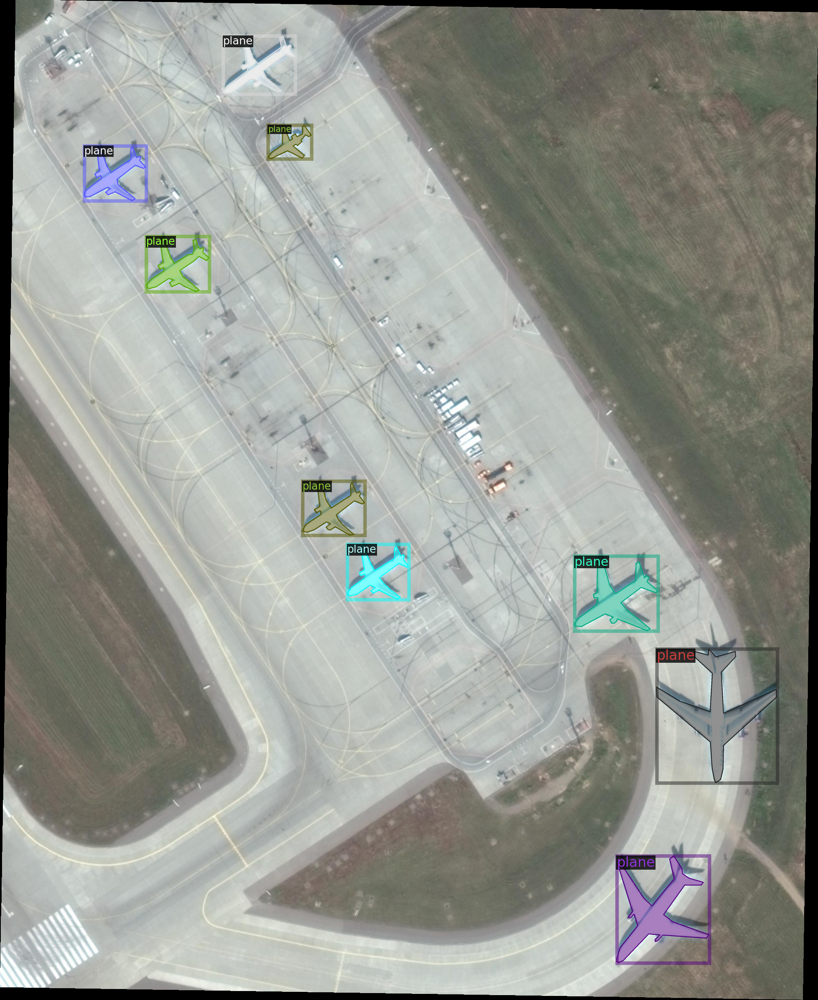

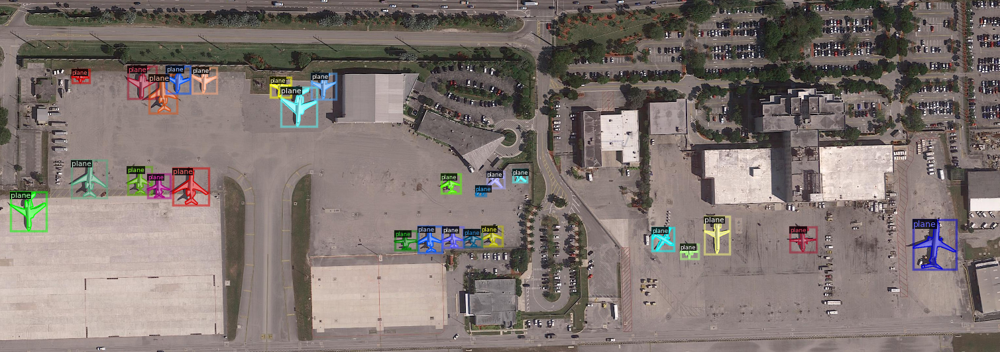

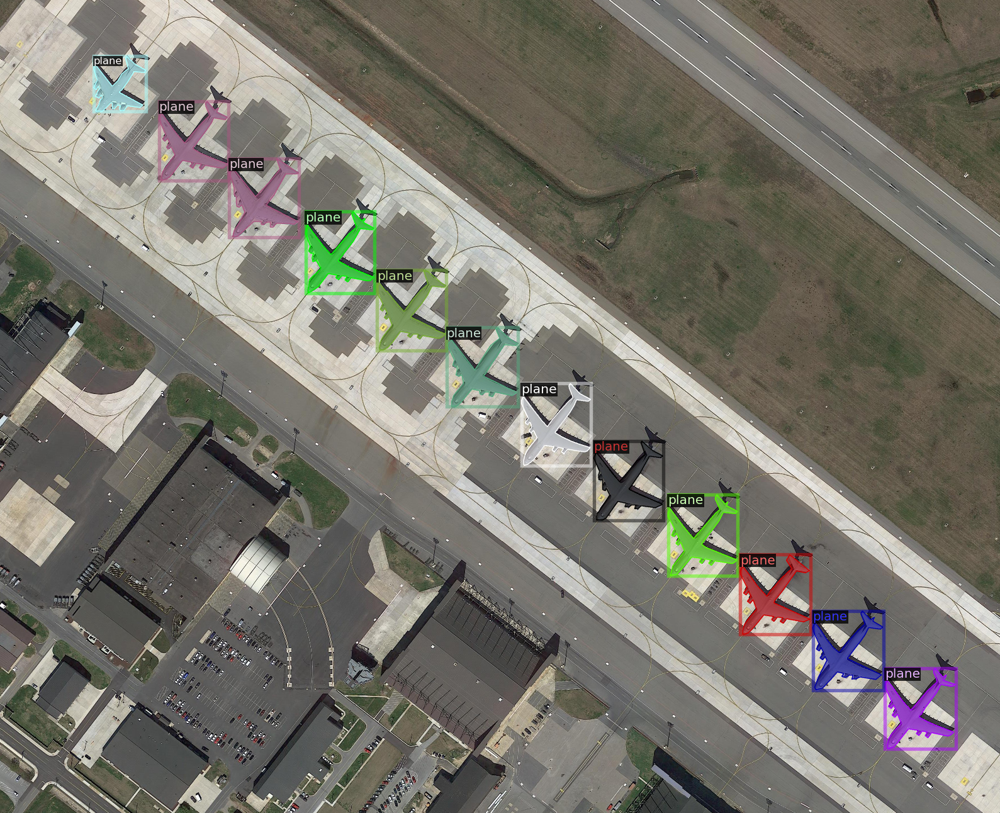

In [ ]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''
dataset_dicts = get_detection_data("train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=plane_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])



### Set Configs

In [ ]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)


cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ("data_detection_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # "batch size"
cfg.SOLVER.BASE_LR = 0.00025  # LR
cfg.SOLVER.MAX_ITER = 1500    # iterations
cfg.SOLVER.STEPS = []        # decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # "RoIHead batch size"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (Plane)



### Training

In [ ]:
# '''
# # Create a DefaultTrainer using the above config and train the model
# # TODO: approx 5 lines
# '''
# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = DefaultTrainer(cfg)
# trainer.resume_or_load(resume=False)
# trainer.train()


### Evaluation and Visualization

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir "/content/drive/MyDrive/CMPT_CV_lab3/output/"

In [ ]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[11/12 04:46:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/My Drive/CMPT_CV_lab3/output/model_final.pth ...


In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=plane_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

KeyboardInterrupt: ignored

In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_detection_train", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "data_detection_train")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[11/12 04:47:11 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[11/12 04:47:11 d2.evaluation.coco_evaluation]: Trying to convert 'data_detection_train' to COCO format ...
[11/12 04:47:11 d2.data.datasets.coco]: Converting annotations of dataset 'data_detection_train' to COCO format ...)
[11/12 04:47:20 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/12 04:47:21 d2.data.datasets.coco]: Conversion finished, #images: 198, #annotations: 7980
[11/12 04:47:21 d2.data.datasets.coco]: Caching COCO format annotations at './output/data_detection_train_coco_format.json' ...
[11/12 04:47:35 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   plane    | 7980         |
|            |              |
[11/12 04:47:35 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, s

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[11/12 04:47:48 d2.evaluation.evaluator]: Inference done 1/198. Dataloading: 3.6214 s/iter. Inference: 8.7522 s/iter. Eval: 0.0030 s/iter. Total: 12.3784 s/iter. ETA=0:40:38


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/12 04:47:53 d2.evaluation.evaluator]: Inference done 12/198. Dataloading: 0.0112 s/iter. Inference: 0.4942 s/iter. Eval: 0.0035 s/iter. Total: 0.5089 s/iter. ETA=0:01:34
[11/12 04:47:58 d2.evaluation.evaluator]: Inference done 23/198. Dataloading: 0.0905 s/iter. Inference: 0.3904 s/iter. Eval: 0.0017 s/iter. Total: 0.4831 s/iter. ETA=0:01:24
[11/12 04:48:03 d2.evaluation.evaluator]: Inference done 38/198. Dataloading: 0.0545 s/iter. Inference: 0.3629 s/iter. Eval: 0.0011 s/iter. Total: 0.4190 s/iter. ETA=0:01:07
[11/12 04:48:08 d2.evaluation.evaluator]: Inference done 52/198. Dataloading: 0.0462 s/iter. Inference: 0.3567 s/iter. Eval: 0.0013 s/iter. Total: 0.4047 s/iter. ETA=0:00:59
[11/12 04:48:19 d2.evaluation.evaluator]: Inference done 61/198. Dataloading: 0.1898 s/iter. Inference: 0.3468 s/iter. Eval: 0.0012 s/iter. Total: 0.5385 s/iter. ETA=0:01:13
[11/12 04:48:28 d2.evaluation.evaluator]: Inference done 70/198. Dataloading: 0.2330 s/iter. Inference: 0.3554 s/iter. Eval: 0.001

### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


'\n# Bring any changes and updates regarding the improvement in here\n'

## Part 2: Semantic Segmentation

### Data Loader

In [ ]:
data_set = get_detection_data("train")

dicts = []

for data in tqdm(data_set):
  filename = data['file_name']
  annotations =  data['annotations']
  height = data['height']
  width = data['width']
  objects = []

  img = cv2.imread(filename)

  for annotation in annotations:
    bbox = annotation['bbox']
    x1 = bbox[0]
    y1 = bbox[1]
    x2 = x1 + bbox[2]
    y2 = y1 + bbox[3]


    image = img[int(y1):int(y2), int(x1):int(x2)]

    segmentation = annotation['segmentation']
    generic_mask = detectron2.utils.visualizer.GenericMask(segmentation, height, width).mask
    mask = generic_mask[int(y1):int(y2), int(x1):int(x2)]

    obj_img = cv2.resize(image, (128, 128), interpolation=cv2.INTER_AREA)

    obj_mask = cv2.resize(mask, (128, 128), interpolation=cv2.INTER_AREA)

    obj = {
        "mask": obj_mask,
        "image" : obj_img,
        "bbox" : bbox,
    }
    objects.append(obj)

  Image_dict = objects
  dicts.append(Image_dict)


  0%|          | 0/198 [00:00<?, ?it/s]

In [ ]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use the mask attribute of detectron2.utils.visualizer.GenericMask
#     to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''

def get_instance_sample(data, idx, img=None):

      obj_mask = dicts[idx[0]][idx[1]] ['mask']
      obj_img = dicts [idx[0]][idx[1]] ['image']

      return obj_img, obj_mask

In [ ]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(), # Converting the image to tensor and change the image format (Channels-Last => Channels-First)
      ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])

  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
    img = torch.tensor(img, dtype=torch.float)
    mask = torch.tensor(mask, dtype=torch.float)
    return img, mask

  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    idx = self.instance_map[idx]
    data = self.data[idx[0]]
    img, mask = get_instance_sample(data, idx)
    img, mask = self.numpy_to_tensor(img, mask)
    img = img.reshape((3,128,128))
    mask = mask.reshape((1,128,128))
    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [ ]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()


        # Encoder
        self.input_conv = conv(3, 8)
        self.down1 = down(8, 16)
        self.down2 = down(16, 32)
        self.down3 = down(32, 64)
        self.down4 = down(64, 128)
        self.down5 = down(128, 256)
        self.down6 = down(256, 512)

        # Decoder

        self.up1 = up(512, 256)
        self.up2 = up(256, 128)
        self.up3 = up(128, 64)
        self.up4 = up(64, 32)
        self.up5 = up(32, 16)
        self.up6 = up(16, 4)
        self.output_conv = conv(4, 1, False) # ReLu activation is removed to keep the logits for the loss function


    def forward(self, input):
      y = self.input_conv(input)
      y = self.down1(y)
      y = self.down2(y)
      y = self.down3(y)
      y = self.down4(y)
      y = self.down5(y)
      y = self.down6(y)
      y = self.up1(y)
      y = self.up2(y)
      y = self.up3(y)
      y = self.up4(y)
      y = self.up5(y)
      y = self.up6(y)
      output = self.output_conv(y)
      return output

In [ ]:
from torchsummary import summary
model = MyModel().cuda()
summary(model, (3,128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
       BatchNorm2d-2          [-1, 8, 128, 128]              16
              ReLU-3          [-1, 8, 128, 128]               0
              conv-4          [-1, 8, 128, 128]               0
            Conv2d-5         [-1, 16, 128, 128]           1,168
       BatchNorm2d-6         [-1, 16, 128, 128]              32
              ReLU-7         [-1, 16, 128, 128]               0
              conv-8         [-1, 16, 128, 128]               0
         MaxPool2d-9           [-1, 16, 64, 64]               0
             down-10           [-1, 16, 64, 64]               0
           Conv2d-11           [-1, 32, 64, 64]           4,640
      BatchNorm2d-12           [-1, 32, 64, 64]              64
             ReLU-13           [-1, 32, 64, 64]               0
             conv-14           [-1, 32,

### Training

In [ ]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''
# Set the hyperparameters
num_epochs = 60
batch_size = 8
learning_rate = 0.1
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD
# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  torch.save(model.state_dict(), '{}/output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))

'''
# Saving the final model
'''
torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 0, Loss: 0.27758491039276123


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 1, Loss: 0.2035718858242035


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 2, Loss: 0.18435519933700562


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 3, Loss: 0.17115771770477295


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 4, Loss: 0.16181588172912598


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 5, Loss: 0.15301594138145447


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 6, Loss: 0.1458611637353897


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 7, Loss: 0.13966523110866547


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 8, Loss: 0.13398706912994385


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 9, Loss: 0.12926292419433594


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 10, Loss: 0.12443496286869049


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 11, Loss: 0.12017885595560074


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 12, Loss: 0.11663737893104553


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 13, Loss: 0.11305048316717148


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 14, Loss: 0.10952293872833252


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 15, Loss: 0.10681603848934174


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 16, Loss: 0.1045888289809227


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 17, Loss: 0.10181944817304611


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 18, Loss: 0.09853781759738922


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 19, Loss: 0.09681324660778046


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 20, Loss: 0.09469439834356308


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 21, Loss: 0.09263981878757477


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 22, Loss: 0.09082058817148209


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 23, Loss: 0.088828906416893


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 24, Loss: 0.08736249804496765


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 25, Loss: 0.0858173742890358


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 26, Loss: 0.08426569402217865


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 27, Loss: 0.08261335641145706


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 28, Loss: 0.08143603056669235


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 29, Loss: 0.07977940142154694


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 30, Loss: 0.07856857776641846


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 31, Loss: 0.07741397619247437


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 32, Loss: 0.0765819251537323


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 33, Loss: 0.0751664862036705


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 34, Loss: 0.07371854037046432


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 35, Loss: 0.0731298178434372


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 36, Loss: 0.0724855437874794


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 37, Loss: 0.0713999792933464


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 38, Loss: 0.07059324532747269


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 39, Loss: 0.06969956308603287


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 40, Loss: 0.06888515502214432


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 41, Loss: 0.06845153123140335


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 42, Loss: 0.06736937910318375


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 43, Loss: 0.06655028462409973


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 44, Loss: 0.06608396023511887


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 45, Loss: 0.0654524713754654


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 46, Loss: 0.06477124243974686


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 47, Loss: 0.06417161971330643


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 48, Loss: 0.06353165209293365


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 49, Loss: 0.0630885511636734


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 50, Loss: 0.062378596514463425


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 51, Loss: 0.06187383085489273


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 52, Loss: 0.061583034694194794


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 53, Loss: 0.061084240674972534


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 54, Loss: 0.06040620058774948


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 55, Loss: 0.060068774968385696


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 56, Loss: 0.059643954038619995


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 57, Loss: 0.059147000312805176


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 58, Loss: 0.058631736785173416


  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

Epoch: 59, Loss: 0.05807679146528244


### Evaluation and Visualization

In [ ]:
#for Part 2 training
%load_ext tensorboard
%tensorboard --logdir drive/My\ Drive/CMPT_CV_lab3/output

<IPython.core.display.Javascript object>

In [ ]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
from torch.nn.quantizable.modules import activation

batch_size = 8
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('train', batch_size)

total_iou = 0
total_images = 0
for (img, mask) in tqdm(loader):

  with torch.no_grad():
    img = img.cuda()
    mask = mask.cuda()
    mask = torch.unsqueeze(mask,1)
    pred = model(img)

    '''
    ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
    '''
    for i in range(img.shape[0]):
      prediction = torch.round(actv(pred[i])[0]).cpu().detach().numpy().astype(np.int)
      truth = torch.round(actv(mask[i])[0]).cpu().detach().numpy().astype(np.int)


      iou = np.sum(np.logical_and(truth, prediction)) / np.sum(np.logical_or(truth, prediction))

      total_iou += iou
      total_images += 1  # Increment total_images by 1 for each image

# Calculate the Mean IoU
mean_iou = total_iou / total_images

print("\n #images: {}, Mean IoU: {}".format(total_images, mean_iou))

  0%|          | 0/998 [00:00<?, ?it/s]

<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)
<ipython-input-23-2e3583b53422>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach()

NameError: ignored

In [ ]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
import matplotlib.pyplot as plt

# Visualize 3 sample outputs
for i in range(3):
    img_sample = img[i].cpu().numpy()
    mask_sample = mask[i].squeeze().cpu().numpy()  # Remove the channel dimension
    pred_sample = pred[i].cpu().numpy()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_sample.transpose(1, 2, 0))  # img is in CHW format
    plt.title('Input Image')

    plt.subplot(1, 3, 2)
    plt.imshow(mask_sample, cmap='gray')  # Now it's a 2D grayscale image
    plt.title('Ground Truth Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(pred_sample[0], cmap='gray')
    plt.title('Predicted Mask')

    plt.show()

## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [ ]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# It is better to keep everything (as well as the output of this funcion) on gpu as tensors to speed up the operations.
# pred_mask is the instance segmentation result and should have different values for different planes.
# TODO: approx 35 lines
'''
def sigmoid(x): # formula from online
  return 1/(1 + np.exp(-x))


def get_prediction_mask(data, data_index):
  filename = data['file_name']
  img = cv2.imread(filename)
  output = predictor(img)['instances']
  gt_mask = np.zeros((data['height'],data['width']))
  pred_mask = np.zeros((data['height'],data['width']))

  for i in range(len(output)):
    bbox = np.array(np.floor(list(output[i]._fields['pred_boxes'])[0].cpu().numpy()), dtype=np.uint32) # Getting the bounding boxes
    x1,y1,x2,y2 = [int(i) for i in bbox] # since bounding box is in

    width = x2-x1
    height = y2-y1
    dim = (width,height)
    sub_mask = img[y1:y2, x1:x2]
    sub_mask = cv2.resize(sub_mask, (128, 128), interpolation = cv2.INTER_AREA) # resize

    temp_mask = model(torch.unsqueeze(torch.tensor(transforms.ToTensor()(sub_mask), device=torch.device('cuda')), 0)).cpu().clone().detach().numpy()[0]


    temp_mask = cv2.resize(temp_mask[0] , dim, interpolation = cv2.INTER_AREA)
    temp_mask = np.rint(sigmoid(temp_mask))*(i+1)
    pred_mask[y1:y2, x1:x2] = temp_mask
  for idx  in range(len(data['annotations'])):
    annos = data['annotations'][idx]
    bbox = annos['bbox']
    x,y,width,height = [int(i) for i in bbox] # since bounding box is in

    dim = (width,height)
    mask =cv2.resize(dicts[data_index][idx]["mask"], dim, interpolation = cv2.INTER_AREA) #reshape to orignal image

    gt_mask[y:y+height, x:x+width] = mask #grounding mask
  return torch.tensor(img, device=torch.device('cuda')), torch.tensor(gt_mask, device=torch.device('cuda')) , torch.tensor(pred_mask, device=torch.device('cuda')) # gt_mask could be all zero when the ground truth is not given.


### Visualization and Submission

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))

for pair in random.sample(list(enumerate(my_data_list)), 3):
    index, d = pair
    img, gt_mask, pred_mask = get_prediction_mask(d,index)
    img = np.array(img.cpu()) * 255
    gt_mask = np.array(gt_mask.cpu())*255
    pred_mask = np.array(pred_mask.cpu())*255
    cv2_imshow(cv2.resize(img, (img.shape[1]//3, img.shape[0]//3), interpolation = cv2.INTER_AREA))
    cv2_imshow(cv2.resize(gt_mask, (gt_mask.shape[1]//3, gt_mask.shape[0]//3), interpolation = cv2.INTER_AREA))
    cv2_imshow(cv2.resize(pred_mask, (pred_mask.shape[1]//3, pred_mask.shape[0]//3), interpolation = cv2.INTER_AREA))



In [ ]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [ ]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample,i)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample,i)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

### Network

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/outputPart4/".format(BASE_DIR)


cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = ("data_detection_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # "batch size"
cfg.SOLVER.BASE_LR = 0.00025  # LR
cfg.SOLVER.MAX_ITER = 1500    # iterations
cfg.SOLVER.STEPS = []        # decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # "RoIHead batch size"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (Plane)

### Training

In [ ]:
# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = DefaultTrainer(cfg)
# trainer.resume_or_load(resume=False)   #default False

# trainer.train()





### Evaluation and Visualization

In [ ]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [ ]:
# '''
# # Visualize the output for 3 random test samples
# # TODO: approx 10 lines
# '''
# from detectron2.utils.visualizer import ColorMode
# dataset_dicts = get_detection_data("test")
# for d in random.sample(dataset_dicts, 3):
#     im = cv2.imread(d["file_name"])
#     outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
#     v = Visualizer(im[:, :, ::-1],
#                    metadata=plane_metadata,
#                    scale=0.5,
#                    instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
#     )
#     out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#     cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_detection_train", output_dir="./outputPart4")
val_loader = build_detection_test_loader(cfg, "data_detection_train")
print(inference_on_dataset(predictor.model, val_loader, evaluator))